# Preprocessing

We apply the same preprocessing steps from Chapter 1 to our new set of data. We do not retrain our models but we import the models that we trained on our previous data and model returns on a fresh, out-of-sample dataset. This allows us to assess results in an unbiased fashion.

Based on our results in the previous chapter, we will test the three approaches with the most promising results: Random Forest, ARIMA and RLRT

Number of ETFs: 585
Number of timestamps: 250
                            AADR   AAXJ  ABCS   ACWI   ACWX
Timestamp                                                  
2023-01-03 05:00:00+00:00  47.19  65.67   NaN  84.90  45.80
2023-01-04 05:00:00+00:00  47.53  67.92   NaN  85.98  46.70
2023-01-05 05:00:00+00:00  47.34  67.56   NaN  85.10  46.30
2023-01-06 05:00:00+00:00  48.10  68.77   NaN  87.07  47.39
2023-01-09 05:00:00+00:00  48.29  69.29   NaN  87.26  47.62
AAXJ     0.0
ABCS    97.2
ACWI     0.0
ACWX     0.0
AGNG     0.0
        ... 
XBIL    17.2
XFIX    67.6
XT       0.0
YLDE     0.0
ZZZ     99.2
Length: 584, dtype: float64


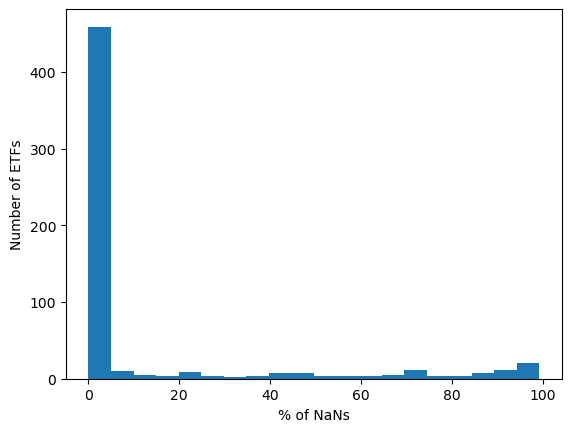

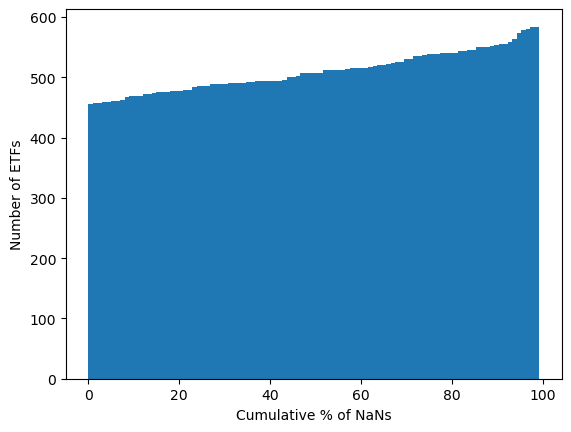

Number of valid ETFs: 451
Number of valid ETFs: 451


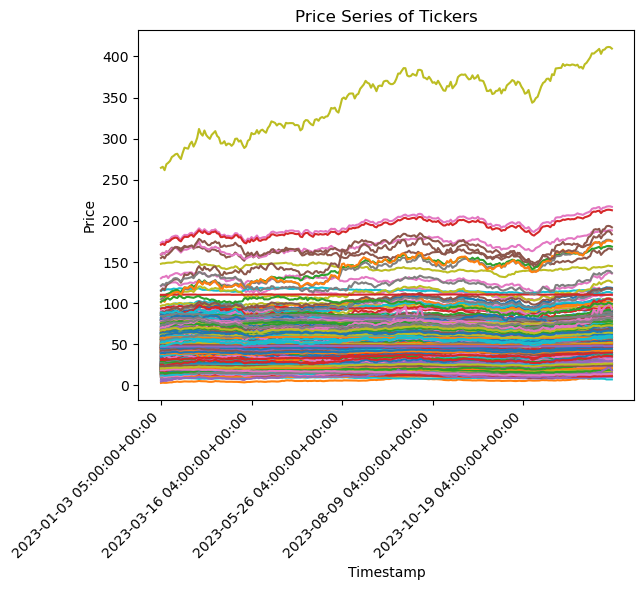

                               AAXJ      ACWI      ACWX      AGNG      AGZD
Timestamp                                                                  
2023-01-04 05:00:00+00:00  0.034262  0.012721  0.019651  0.008779  0.002421
2023-01-05 05:00:00+00:00 -0.005300 -0.010235 -0.008565 -0.005311  0.001495
2023-01-06 05:00:00+00:00  0.017910  0.023149  0.023542  0.019947 -0.000689
2023-01-09 05:00:00+00:00  0.007561  0.002182  0.004853 -0.010269  0.001379
2023-01-10 05:00:00+00:00  0.006206  0.005615  0.004620  0.007508  0.000803


In [10]:
# Imports, read and preview data

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import pickle
from sklearn.preprocessing import MinMaxScaler
from scipy.stats import linregress
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, accuracy_score, mean_squared_error, mean_absolute_error

df = pd.read_csv("../../data/etf_prices_backtest.csv")
df.set_index("Timestamp", inplace=True)

print(f"Number of ETFs: {df.shape[1]}\nNumber of timestamps: {df.shape[0]}")
print(df.iloc[:,:5].head())

# Percentage of NaN values per ticker

nan_percentages = df.isna().mean()[1:] * 100

# Distribution of percentage of NaN values

plt.hist(nan_percentages, cumulative=False, bins=20)
plt.xlabel("% of NaNs")
plt.ylabel("Number of ETFs")
plt.show()

# Cumulative distribution of percentage of NaN values

plt.hist(nan_percentages, cumulative=True, bins=100)
plt.xlabel("Cumulative % of NaNs")
plt.ylabel("Number of ETFs")
plt.show()

# Drop series with more than 25% NaN values

valid_etfs = nan_percentages[nan_percentages == 0]
df = df[valid_etfs.index]

# Drop series if first or last value is NaN

valid_columns = df.columns[df.iloc[0].notna() & df.iloc[-1].notna()]
df = df[valid_columns]

for column in df.columns:
    plt.plot(df.index, df[column], label=column)

    # Add labels and legend
plt.xlabel('Timestamp')
plt.ylabel('Price')
plt.title('Price Series of Tickers')
num_ticks = 5  # Specify the number of ticks you want to display
plt.xticks(df.index[::len(df.index)//num_ticks])
plt.xticks(rotation=45, ha='right')
plt.show()

# Compute returns

df_returns = df.pct_change().iloc[1:]

# Save variables in a pickle file

with open('../../data/ch3_etfs_backtest.pkl', 'wb') as f:
    pickle.dump([df, df_returns], f)

with open('../../data/ch1_etfs_valid_pairs.pkl', 'rb') as f:
    valid_pairs = pickle.load(f)

Processed 0/247 data points
Processed 100/247 data points
Processed 200/247 data points

Results for R² threshold 0.4:
Accuracy: 79.01%
Total signals: 81
Correct predictions: 64
Accuracy of generated signals: 79.01%
Average R² Confidence: 0.3002

Results for R² threshold 0.5:
Accuracy: 84.21%
Total signals: 57
Correct predictions: 48
Accuracy of generated signals: 84.21%
Average R² Confidence: 0.3002

Results for R² threshold 0.6:
Accuracy: 86.84%
Total signals: 38
Correct predictions: 33
Accuracy of generated signals: 86.84%
Average R² Confidence: 0.3002
Processed 0/247 data points
Processed 100/247 data points
Processed 200/247 data points

Results for R² threshold 0.4:
Accuracy: 86.61%
Total signals: 112
Correct predictions: 97
Accuracy of generated signals: 86.61%
Average R² Confidence: 0.3765

Results for R² threshold 0.5:
Accuracy: 89.13%
Total signals: 92
Correct predictions: 82
Accuracy of generated signals: 89.13%
Average R² Confidence: 0.3765

Results for R² threshold 0.6:
Ac

/var/folders/q9/kw9849fs50s9d34q6y66ny200000gn/T/ipykernel_24938/3622802813.py:198: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax1 = plt.subplots(figsize=(12, 6))


Processed 0/247 data points
Processed 100/247 data points
Processed 200/247 data points

Results for R² threshold 0.4:
Accuracy: 79.21%
Total signals: 101
Correct predictions: 80
Accuracy of generated signals: 79.21%
Average R² Confidence: 0.3495

Results for R² threshold 0.5:
Accuracy: 81.58%
Total signals: 76
Correct predictions: 62
Accuracy of generated signals: 81.58%
Average R² Confidence: 0.3495

Results for R² threshold 0.6:
Accuracy: 77.36%
Total signals: 53
Correct predictions: 41
Accuracy of generated signals: 77.36%
Average R² Confidence: 0.3495
Processed 0/247 data points
Processed 100/247 data points
Processed 200/247 data points

Results for R² threshold 0.4:
Accuracy: 83.93%
Total signals: 112
Correct predictions: 94
Accuracy of generated signals: 83.93%
Average R² Confidence: 0.3821

Results for R² threshold 0.5:
Accuracy: 87.10%
Total signals: 93
Correct predictions: 81
Accuracy of generated signals: 87.10%
Average R² Confidence: 0.3821

Results for R² threshold 0.6:
A

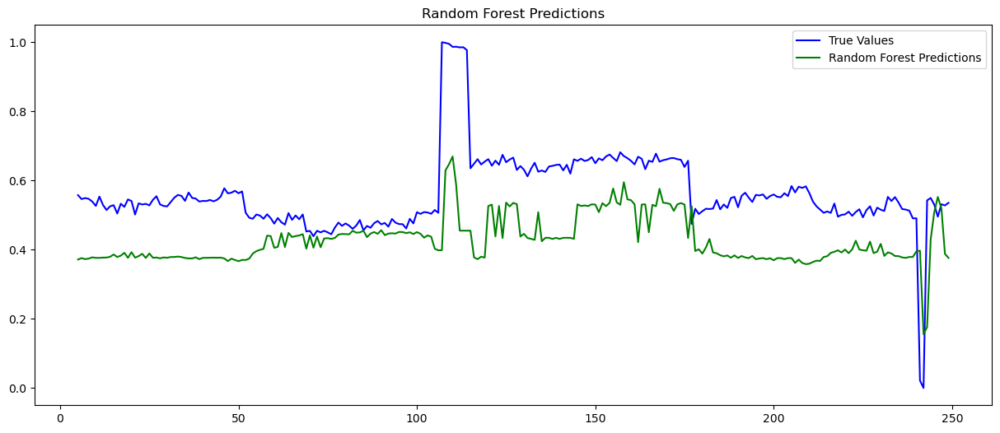

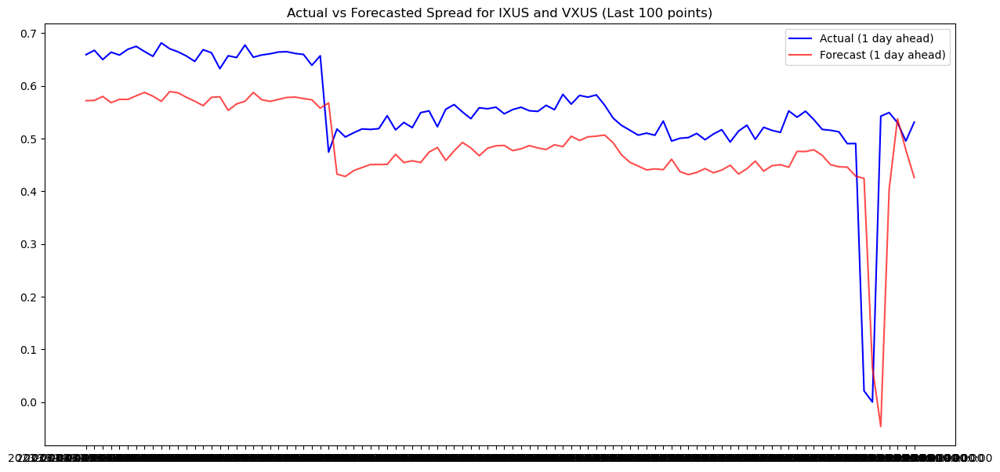

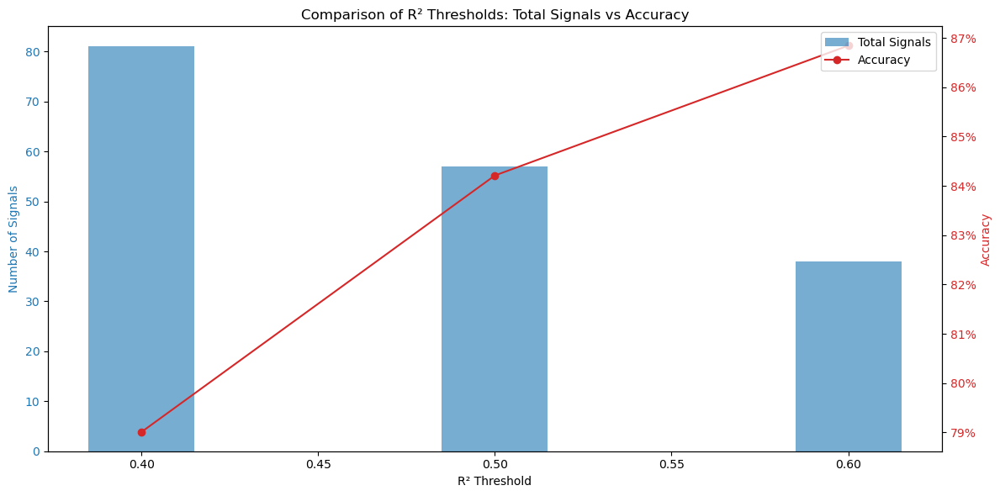

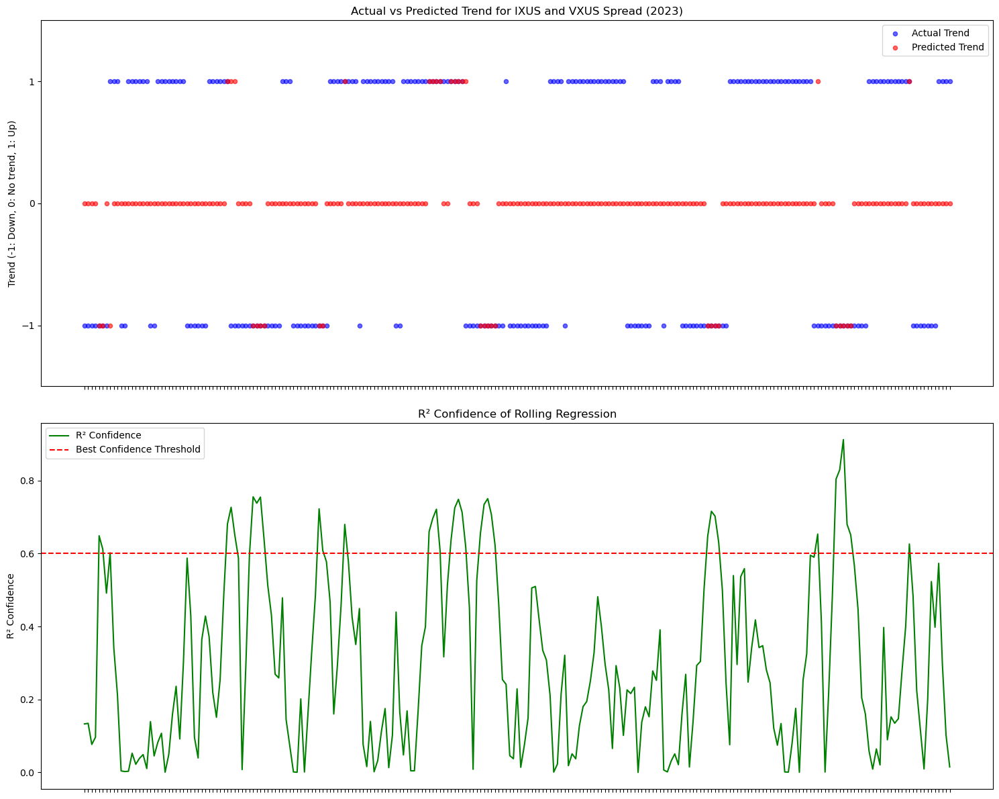

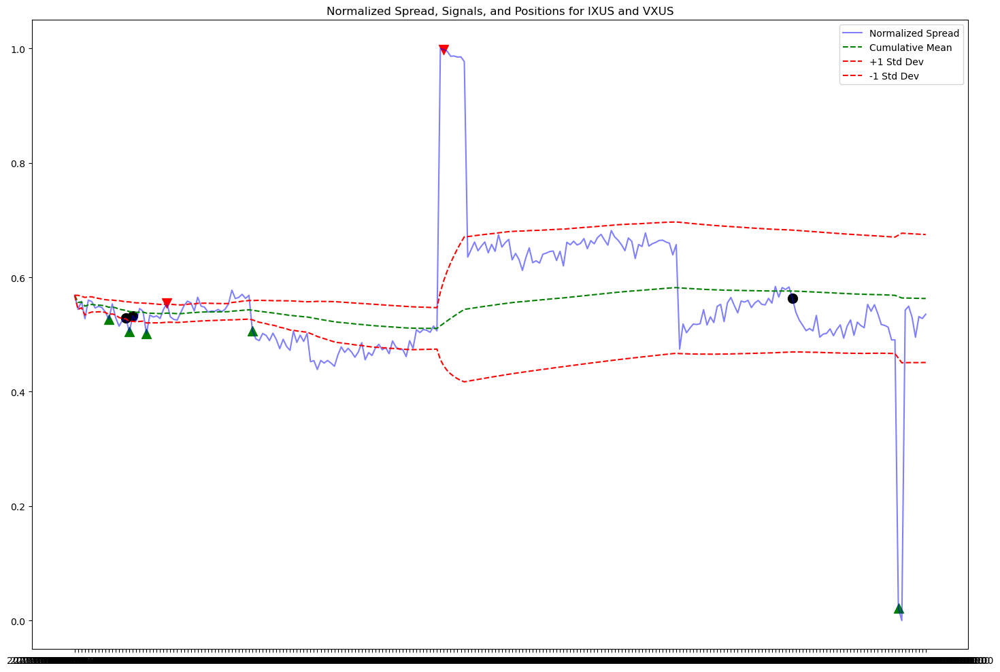

...

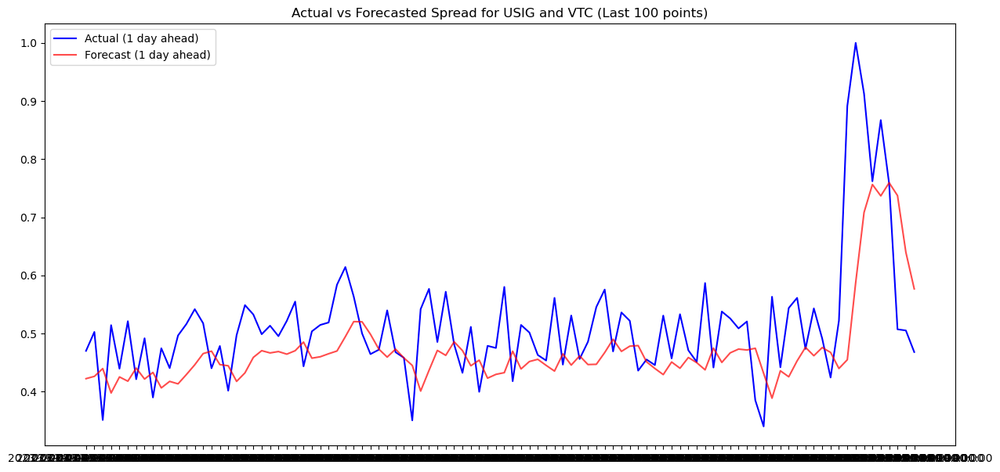

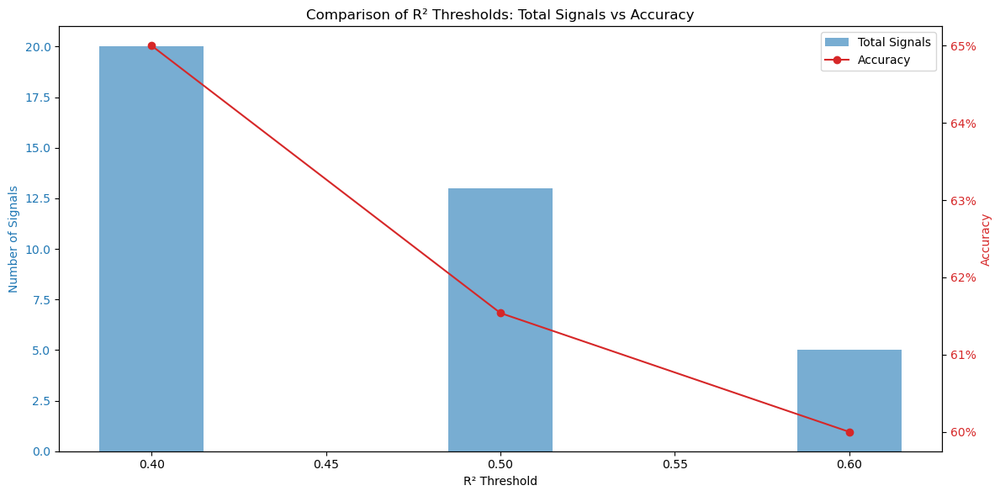

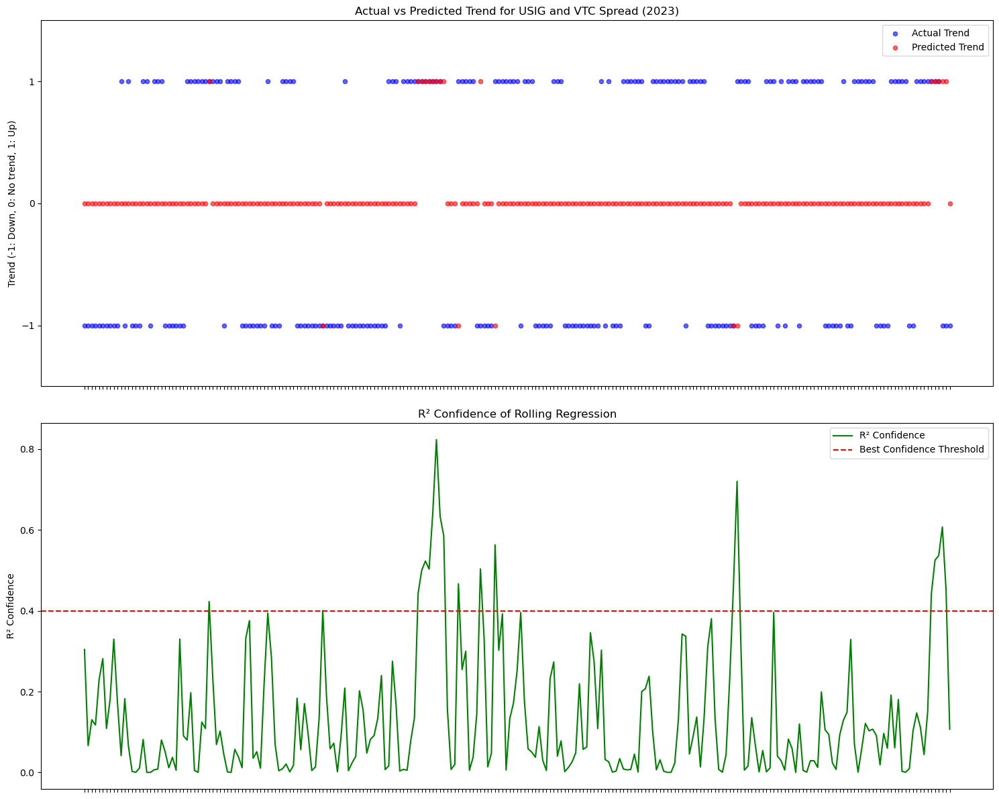

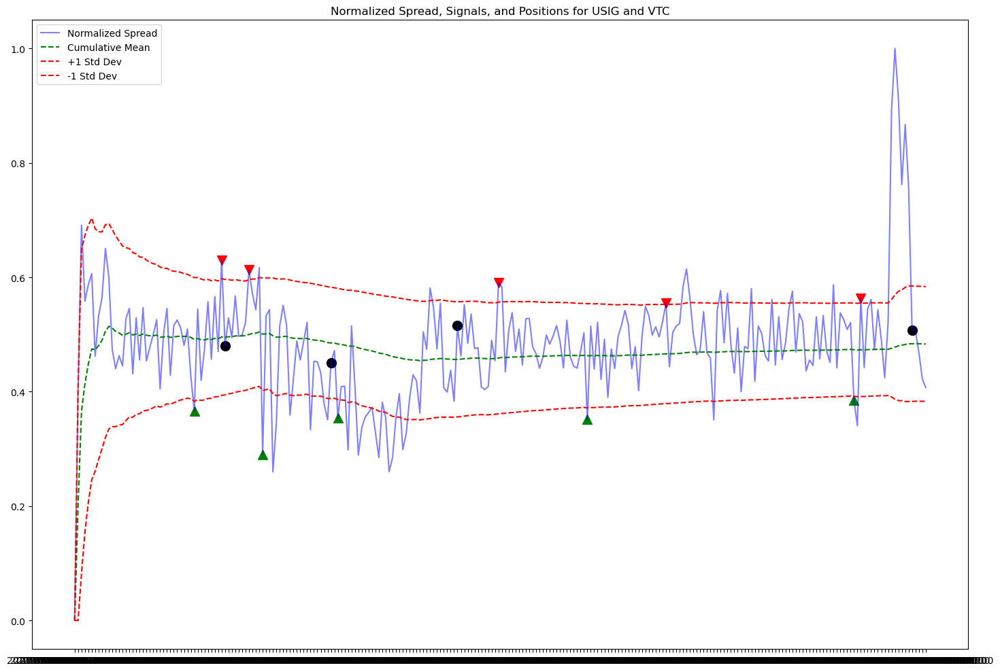

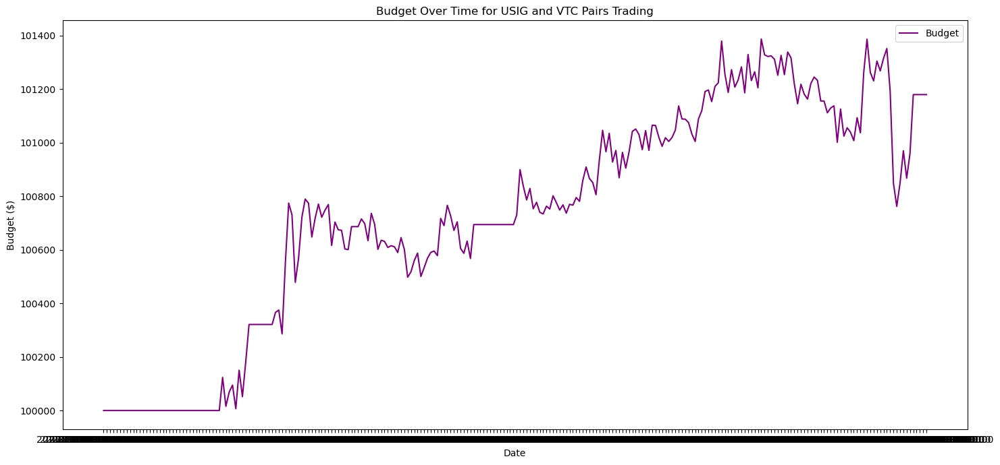

In [14]:
def rolling_regression_trend_with_confidence(data, window_size=10, forecast_days=3, r2_threshold=0.5):
    trends = []
    confidences = []
    for i in range(window_size, len(data) - forecast_days + 1):
        X = np.arange(window_size).reshape(-1, 1)
        y = data[i-window_size:i]
        model = LinearRegression()
        model.fit(X, y)
        
        r2 = r2_score(y, model.predict(X))
        
        if r2 > r2_threshold:
            trend = 1 if model.coef_[0] > 0 else -1 if model.coef_[0] < 0 else 0
        else:
            trend = 0
        
        trends.append(trend)
        confidences.append(r2)
    return np.array(trends), np.array(confidences)

def actual_trend(data, window_size=10, forecast_days=3):
    trends = []
    for i in range(window_size, len(data) - forecast_days + 1):
        past_avg = np.mean(data[i-window_size:i])
        future_avg = np.mean(data[i:i+forecast_days])
        trend = 1 if future_avg > past_avg else -1 if future_avg < past_avg else 0
        trends.append(trend)
    return np.array(trends)

def evaluate_threshold(data, actual_trends, r2_threshold):
    predicted_trends, confidences = rolling_regression_trend_with_confidence(data, r2_threshold=r2_threshold)
    
    non_zero_predictions = predicted_trends != 0
    accuracy = accuracy_score(actual_trends[non_zero_predictions], predicted_trends[non_zero_predictions])
    
    total_predictions = sum(predicted_trends != 0)
    correct_predictions = sum((predicted_trends == actual_trends) & (predicted_trends != 0))
    accuracy_percentage = (correct_predictions / total_predictions * 100) if total_predictions > 0 else 0
    
    return {
        'threshold': r2_threshold,
        'accuracy': accuracy,
        'total_signals': total_predictions,
        'correct_predictions': correct_predictions,
        'accuracy_percentage': accuracy_percentage,
        'average_confidence': np.mean(confidences)
    }

def create_lagged_features(series, lags=5):
    spread = pd.Series(series, name='spread')
    df = pd.DataFrame(spread)
    for lag in range(1, lags + 1):
        df[f'lag_{lag}'] = df['spread'].shift(lag)
    df.dropna(inplace=True)
    return df

def forecast_next_3_days(model, last_data_point):
    forecast = model.forecast(steps=3)
    return forecast

def calculate_trend(data):
    return np.sign(np.diff(data))

evaluation_results = []

for pair in valid_pairs:
    ticker_1 = pair[0]
    ticker_2 = pair[1]
    
    with open(f'../../data/ch3_{ticker_1}_{ticker_2}_random_forest.pkl', 'rb') as f:
        rf_model = pickle.load(f)

    with open('../../data/ch3_etfs_backtest.pkl', 'rb') as f:
        df, df_returns = pickle.load(f)

    with open(f'../../data/ch3_{ticker_1}_{ticker_2}_arima.pkl', 'rb') as f:
        model = pickle.load(f)

    df = df[[ticker_1, ticker_2]]

    evaluation_dict = {}

    evaluation_dict["Name"] = f'{ticker_1} and {ticker_2}'

    ticker_series_1 = df[ticker_1]
    ticker_series_2 = df[ticker_2]

    slope, intercept, _, _, _ = linregress(ticker_series_1, ticker_series_2)
    spread = ticker_series_2 - (slope * ticker_series_1 + intercept)

    data = spread.values

    scaler = MinMaxScaler(feature_range=(0, 1))
    data = scaler.fit_transform(data.reshape(-1, 1)).reshape(-1)

    lags = 5
    lagged_df = create_lagged_features(data, lags=lags)

    X = lagged_df.drop(columns=['spread'])
    y = lagged_df['spread']

    rf_predictions = rf_model.predict(X)

    rf_mse = mean_squared_error(y, rf_predictions)
    rf_mae = mean_absolute_error(y, rf_predictions)
    evaluation_dict["Random Forest MSE"] = rf_mse
    evaluation_dict["Random Forest MAE"] = rf_mae

    plt.figure(figsize=(15, 6))
    plt.title('Random Forest Predictions')
    plt.plot(y.index, y, label='True Values', color='blue')
    plt.plot(y.index, rf_predictions, label='Random Forest Predictions', color='green')
    plt.legend()
    plt.savefig(f'../../assets/etfs/{ticker_1}_{ticker_2}/rf_backtest_predictions_plot.png')

    trend_rf = []
    for i in range(1, len(y)-10):
        if rf_predictions[i] > y.iloc[i-1]:
            trend_rf.append(1)
        elif rf_predictions[i] < y.iloc[i-1]:
            trend_rf.append(-1)
        else:
            trend_rf.append(0)

    trend_rf_true = []
    for i in range(1, len(y)-10):
        if y.iloc[i] > y.iloc[i-1]:
            trend_rf_true.append(1)
        elif y.iloc[i] < y.iloc[i-1]:
            trend_rf_true.append(-1)
        else:
            trend_rf_true.append(0)

    accuracy_trend = [trend_rf[i] == trend_rf_true[i] for i in range(len(trend_rf))] 
    evaluation_dict["Random Forest Trend Accuracy"] = np.sum(accuracy_trend)/len(accuracy_trend)

    all_forecasts = []
    actual_values = []

    for i in range(len(data) - 3):
        current_data = data[i]
        
        model = model.append([current_data])
        
        forecast = forecast_next_3_days(model, current_data)
        
        all_forecasts.append(forecast)
        actual_values.append(data[i+1:i+4])

        if i % 100 == 0:
            print(f"Processed {i}/{len(data)-3} data points")

    all_forecasts = np.array(all_forecasts)
    actual_values = np.array(actual_values)

    mse = mean_squared_error(actual_values.ravel(), all_forecasts.ravel())
    mae = mean_absolute_error(actual_values.ravel(), all_forecasts.ravel())

    plt.figure(figsize=(15, 7))
    last_100_index = spread.index[-103:-3]  # Adjust index for the last 100 points
    plt.plot(last_100_index, actual_values[-100:, 0], label='Actual (1 day ahead)', color='blue')
    plt.plot(last_100_index, all_forecasts[-100:, 0], label='Forecast (1 day ahead)', color='red', alpha=0.7)
    plt.title(f'Actual vs Forecasted Spread for {ticker_1} and {ticker_2} (Last 100 points)')
    plt.legend()
    plt.savefig(f'../../assets/etfs/{ticker_1}_{ticker_2}/arima_backtest_predictions_plot.png')    

    actual_trends = calculate_trend(actual_values[:, 0])
    forecast_trends = calculate_trend(all_forecasts[:, 0])

    trend_accuracy = np.mean(actual_trends == forecast_trends)

    evaluation_dict["ARIMA MSE"] = mse
    evaluation_dict["ARIMA MAE"] = mae
    evaluation_dict["ARIMA Trend Accuracy"] = trend_accuracy

    min_length = min(len(data), len(spread.index))
    data = data[:min_length]
    dates = spread.index[:min_length]

    actual_trends = actual_trend(data)

    thresholds = [0.4, 0.5, 0.6]
    results = []

    for threshold in thresholds:
        result = evaluate_threshold(data, actual_trends, threshold)
        results.append(result)
        print(f"\nResults for R² threshold {threshold}:")
        print(f"Accuracy: {result['accuracy']:.2%}")
        print(f"Total signals: {result['total_signals']}")
        print(f"Correct predictions: {result['correct_predictions']}")
        print(f"Accuracy of generated signals: {result['accuracy_percentage']:.2f}%")
        print(f"Average R² Confidence: {result['average_confidence']:.4f}")

    total_signals = [result['total_signals'] for result in results]
    accuracies = [result['accuracy'] for result in results]

    fig, ax1 = plt.subplots(figsize=(12, 6))

    color = 'tab:blue'
    bar_width = 0.03
    ax1.set_xlabel('R² Threshold')
    ax1.set_ylabel('Number of Signals', color=color)
    ax1.bar(thresholds, total_signals, width=bar_width, alpha=0.6, color=color, label='Total Signals')
    ax1.tick_params(axis='y', labelcolor=color)

    ax2 = ax1.twinx()
    color = 'tab:red'
    ax2.set_ylabel('Accuracy', color=color)
    ax2.plot(thresholds, accuracies, color=color, marker='o', label='Accuracy')
    ax2.tick_params(axis='y', labelcolor=color)

    ax2.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: '{:.0%}'.format(y)))

    plt.title('Comparison of R² Thresholds: Total Signals vs Accuracy')
    fig.legend(loc="upper right", bbox_to_anchor=(1,1), bbox_transform=ax1.transAxes)

    plt.tight_layout()
    plt.savefig(f'../../assets/etfs/{ticker_1}_{ticker_2}/rlrt_threshold_optimization_plot.png')

    best_threshold = max(results, key=lambda x: x['accuracy'])['threshold']

    predicted_trends, confidences = rolling_regression_trend_with_confidence(data, r2_threshold=best_threshold)

    min_length = min(len(predicted_trends), len(actual_trends), len(dates) - 13)
    predicted_trends = predicted_trends[:min_length]
    actual_trends = actual_trends[:min_length]
    confidences = confidences[:min_length]
    plot_dates = dates[13:13+min_length]

    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(15, 12), sharex=True)

    ax1.scatter(plot_dates, actual_trends, label='Actual Trend', color='blue', alpha=0.6, s=20)
    ax1.scatter(plot_dates, predicted_trends, label='Predicted Trend', color='red', alpha=0.6, s=20)

    ax1.set_title(f'Actual vs Predicted Trend for {ticker_1} and {ticker_2} Spread (2023)')
    ax1.set_ylabel('Trend (-1: Down, 0: No trend, 1: Up)')
    ax1.legend()
    ax1.set_ylim(-1.5, 1.5)
    ax1.set_yticks([-1, 0, 1])

    ax2.plot(plot_dates, confidences, label='R² Confidence', color='green')
    ax2.axhline(y=best_threshold, color='r', linestyle='--', label='Best Confidence Threshold')
    ax2.set_title('R² Confidence of Rolling Regression')
    ax2.set_ylabel('R² Confidence')
    ax2.legend()

    plt.setp(ax1.get_xticklabels(), visible=False)
    plt.setp(ax2.get_xticklabels(), visible=False)
    plt.tight_layout()
    plt.subplots_adjust(hspace=0.1)

    plt.savefig(f'../../assets/etfs/{ticker_1}_{ticker_2}/rlrt_r2_confidence_plot.png')

    ticker_series_1 = df[ticker_1]
    ticker_series_2 = df[ticker_2]

    slope, intercept, _, _, _ = linregress(ticker_series_1, ticker_series_2)
    spread = ticker_series_2 - (slope * ticker_series_1 + intercept)

    scaler = MinMaxScaler(feature_range=(0, 1))
    data = scaler.fit_transform(spread.values.reshape(-1, 1)).reshape(-1)

    initial_budget = 100000
    dates = df.index

    window_size = 10

    signals = ['None'] * len(data)
    positions = [0] * len(data)
    budgets = [initial_budget] * len(data)

    cumulative_mean = np.zeros(len(data))
    cumulative_std = np.zeros(len(data))

    padded_predictions = [None] * window_size + list(predicted_trends)
    if len(padded_predictions) < len(data):
        padded_predictions.extend([None] * (len(data) - len(padded_predictions)))
    else:
        padded_predictions = padded_predictions[:len(data)]

    for i in range(len(data)):
        if i < window_size:
            cumulative_mean[i] = np.mean(data[:i+1])
            cumulative_std[i] = np.std(data[:i+1]) if i > 0 else 0
            continue
        
        cumulative_mean[i] = np.mean(data[:i+1])
        cumulative_std[i] = np.std(data[:i+1])
        
        spread_value = data[i]
        trend_prediction = padded_predictions[i] if padded_predictions[i] is not None else 0
        
        if spread_value > cumulative_mean[i] + cumulative_std[i]:
            if trend_prediction <= 0:
                signals[i] = "Short"
            else:
                signals[i] = "None"
        elif spread_value < cumulative_mean[i] - cumulative_std[i]:
            if trend_prediction >= 0:
                signals[i] = "Long"
            else:
                signals[i] = "None"
        else:
            if trend_prediction == 1:
                signals[i] = "Exit Short"
            elif trend_prediction == -1:
                signals[i] = "Exit Long"
            else:
                signals[i] = "None"
        
        current_position = positions[i-1]
        if signals[i] == "Short" and current_position != -1:
            if current_position == 1:
                returns = (ticker_series_2.iloc[i] / ticker_series_2.iloc[i-1] - 1) - \
                        (ticker_series_1.iloc[i] / ticker_series_1.iloc[i-1] - 1)
                budgets[i] = budgets[i-1] * (1 + returns)
            positions[i] = -1
        elif signals[i] == "Long" and current_position != 1:
            if current_position == -1:
                returns = -((ticker_series_2.iloc[i] / ticker_series_2.iloc[i-1] - 1) - \
                            (ticker_series_1.iloc[i] / ticker_series_1.iloc[i-1] - 1))
                budgets[i] = budgets[i-1] * (1 + returns)
            positions[i] = 1
        elif (signals[i] == "Exit Short" and current_position == -1) or (signals[i] == "Exit Long" and current_position == 1):
            returns = current_position * ((ticker_series_2.iloc[i] / ticker_series_2.iloc[i-1] - 1) - \
                                        (ticker_series_1.iloc[i] / ticker_series_1.iloc[i-1] - 1))
            budgets[i] = budgets[i-1] * (1 + returns)
            positions[i] = 0
        else:
            positions[i] = current_position
            
        if current_position != 0:
            returns = current_position * ((ticker_series_2.iloc[i] / ticker_series_2.iloc[i-1] - 1) - \
                                        (ticker_series_1.iloc[i] / ticker_series_1.iloc[i-1] - 1))
            budgets[i] = budgets[i-1] * (1 + returns)
        else:
            budgets[i] = budgets[i-1]

    results_df = pd.DataFrame({
        'Date': dates,
        'Spread': data,
        'Predicted_Trend': padded_predictions,
        'Signal': signals,
        'Position': positions,
        'Budget': budgets,
        ticker_1: ticker_series_1,
        ticker_2: ticker_series_2
    })

    results_df['Daily_Return'] = results_df['Budget'].pct_change()
    results_df['Cumulative_Return'] = results_df['Budget'] / initial_budget - 1

    roll_max = results_df['Budget'].cummax()
    daily_drawdown = results_df['Budget'] / roll_max - 1.0
    max_drawdown = daily_drawdown.min()

    plt.figure(figsize=(15, 10))
    plt.plot(dates, data, label='Normalized Spread', color='blue', alpha=0.5)
    plt.plot(dates, cumulative_mean, color='green', linestyle='--', label='Cumulative Mean')
    plt.plot(dates, cumulative_mean + cumulative_std, color='red', linestyle='--', label='+1 Std Dev')
    plt.plot(dates, cumulative_mean - cumulative_std, color='red', linestyle='--', label='-1 Std Dev')

    for i in range(1, len(positions)):
        if positions[i] != positions[i-1]:
            if positions[i] == 1:
                plt.scatter(dates[i], data[i], color='green', marker='^', s=100)
            elif positions[i] == -1:
                plt.scatter(dates[i], data[i], color='red', marker='v', s=100)
            elif positions[i] == 0:
                plt.scatter(dates[i], data[i], color='black', marker='o', s=100)

    plt.title(f'Normalized Spread, Signals, and Positions for {ticker_1} and {ticker_2}')
    plt.legend()
    plt.tight_layout()
    plt.savefig(f'../../assets/etfs/{ticker_1}_{ticker_2}/rlrt_signals_plot.png')

    plt.figure(figsize=(15, 7))
    plt.plot(dates, budgets, label='Budget', color='purple')
    plt.title(f'Budget Over Time for {ticker_1} and {ticker_2} Pairs Trading')
    plt.xlabel('Date')
    plt.ylabel('Budget ($)')
    plt.legend()
    plt.tight_layout()
    plt.savefig(f'../../assets/etfs/{ticker_1}_{ticker_2}/rlrt_budget_progression_plot.png')

    total_signals = len([s for s in signals if s != "None"])
    long_signals = signals.count("Long")
    short_signals = signals.count("Short")
    exit_long_signals = signals.count("Exit Long")
    exit_short_signals = signals.count("Exit Short")

    start_date = pd.to_datetime(results_df['Date'].iloc[0])
    end_date = pd.to_datetime(results_df['Date'].iloc[-1])

    years = (end_date - start_date).days / 365.25

    total_return = (budgets[-1] / initial_budget) - 1

    annualized_return = (1 + total_return) ** (1 / years) - 1

    evaluation_dict["RLTR Total Return"] = total_return
    evaluation_dict["RLTR Annualized Return"] = annualized_return
    evaluation_dict["RLTR Maximum Drawdown"] = max_drawdown
    evaluation_dict["RLTR Sharpe Ratio"] = np.sqrt(252) * results_df['Daily_Return'].mean() / results_df['Daily_Return'].std()

    evaluation_results.append(evaluation_dict)

evaluation_results_df = pd.DataFrame(evaluation_results)
evaluation_results_df.to_csv('../../assets/etfs/backtesting_results.csv', index=False)

# Random Forest

Using the random forest model we trained earlier, we assess the results of the model on our new data. This yields sub par results, indicating a possible case of overfitting.

# ARIMA

Again, we import the ARIMA model from the previous chapter, compute success criteria and plot results. Especially for ARIMA, we see that the predictions are just a lagged version of the actual values. This indicates that the model is struggling to display any form of learning. The grave difference between train and test results also indicates a case of overfitting.

# RLRT

Our most promising model so far, probably because we do not pre-train a model but fit values into a new model in a rolling window fashion. We run our backtesting window data through the model, compute success metrics and plot results. We see that we achieve similar results to our testing period.